# Style Transfer

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset, TensorDataset
import torchvision.models as models
import wandb
from tqdm import tqdm
import cv2
import os

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"

### Model Loading

In [3]:
model_vgg19 = models.vgg19(weights=models.VGG19_Weights.DEFAULT)
model_vgg19.to(device)

def get_vgg19_model():
    return models.vgg19(weights=models.VGG19_Weights.DEFAULT)

model_vgg19

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

## Loss Function

In [96]:
# content loss
def calculate_content_loss(content_feature, target_feature):
    return F.mse_loss(content_feature, target_feature)

In [97]:
# style loss
def gram_matrix(feature):
    b, c, h, w = feature.size()
    F_xl = feature.reshape(c, -1)
    G_xl = torch.mm(F_xl, F_xl.transpose(0,1)) / (c * h * w)
    return G_xl

# def calculate_style_loss(style_feature, target_feature):
#     G = gram_matrix(style_feature)
#     A = gram_matrix(target_feature)
#     return F.mse_loss(G, A)

def calculate_style_loss(style_gram, target_gram):
    return F.mse_loss(style_gram, target_gram)

## Gradient Descent

In [153]:
# layers_map = {'conv1_1': 0, 'conv2_1': 5, 'conv3_1': 10, 'conv4_1': 19, 'conv5_1': 28}
layers_map = {'conv1_1': 0, 'conv2_1': 2, 'conv3_1': 5, 'conv4_1':7 , 'conv5_1': 10}
layer_name_map = {str(v): k for k, v in layers_map.items()}

class VGGFeatureExtractor(nn.Module):
    def __init__(self):
        super(VGGFeatureExtractor, self).__init__()
        vgg19_model = get_vgg19_model()
        # truncate model till max layer map value
        self.model = nn.Sequential(*list(vgg19_model.features.children())[:max(layers_map.values())+1])

    def forward(self, x):
        features = {}
        for name, layer in self.model._modules.items():
            x = layer(x)
            if name in layer_name_map:
                features[layer_name_map[name]] = x
        return features
VGGFeatureExtractor()

VGGFeatureExtractor(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
)

In [236]:
def transfer_style(content, style, _optimizer='lbfgs', content_weight=1, style_weight=1, lr=1, verbose=False):
    # content and style processing
    content = content.astype(np.float32) / 255
    content = torch.tensor(content).contiguous().permute(2, 0, 1).unsqueeze(0).to(device)
    style = style.astype(np.float32) / 255
    style = torch.tensor(style).contiguous().permute(2, 0, 1).unsqueeze(0).to(device)
    
    # make target from content
    target = content.clone().contiguous().requires_grad_(True).to(device)

    # model and optimizer
    model = VGGFeatureExtractor().to(device)
    model.eval()
    if _optimizer == 'adam':
        optimizer = optim.Adam([target], lr=lr)
    else:
        optimizer = optim.LBFGS([target], lr=lr)
    
    # features
    content_features = model(content)
    style_features = model(style)
    style_grams = [gram_matrix(style_features[layer]) for layer in style_features]
    
    def closure():
        optimizer.zero_grad()
        # target features
        target_features = model(target.contiguous())
        target_grams = [gram_matrix(target_features[layer]) for layer in target_features]
        content_loss = calculate_content_loss(content_features['conv4_1'], target_features['conv4_1'])
        style_loss = 0
        for i in range(5):
            style_loss += calculate_style_loss(style_grams[i], target_grams[i])
        loss = content_weight*content_loss + style_weight*style_loss
        loss.backward(retain_graph=True)
        if verbose:
            print(loss.item())
        return loss
    
    for i in range(3):
        if _optimizer == 'adam':
            closure()
            optimizer.step()
        else:
            optimizer.step(closure)
        
        target.data.clamp_(0, 1)
        
    return target.squeeze().permute(1, 2, 0).cpu().detach().numpy()
        

In [237]:
def perform_style_transfer(content_path, style_path, content_weight=1, style_weight=1, _optimizer='lbfgs', lr=1, show=True, verbose=False):
    content = cv2.imread(content_path)
    style = cv2.imread(style_path)
    content = cv2.resize(content, (224, 224))
    style = cv2.resize(style, (224, 224))
    content = cv2.cvtColor(content, cv2.COLOR_BGR2RGB)
    style = cv2.cvtColor(style, cv2.COLOR_BGR2RGB)
    target = transfer_style(content, style, _optimizer, content_weight, style_weight, lr, verbose)
    
    if not show:
        return target
    
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(content)
    ax[0].set_title("Content")
    ax[0].axis('off')
    ax[1].imshow(style)
    ax[1].set_title("Style")
    ax[1].axis('off')
    ax[2].imshow(target)
    ax[2].set_title("Target")
    ax[2].axis('off')
    plt.suptitle(f"Content Weight: {content_weight}, Style Weight: {style_weight}, Optimizer: {_optimizer}")
    plt.show()

## Running Experiments

In [167]:
content_img_paths = os.listdir("dataset/content")
content_img_paths = [os.path.join("dataset/content", img) for img in content_img_paths]
content_img_paths.sort()    
style_img_paths = os.listdir("dataset/styles")
style_img_paths = [os.path.join("dataset/styles", img) for img in style_img_paths]
style_img_paths.sort()

print("Content Images: ", content_img_paths)
print("Style Images: ", style_img_paths)

Content Images:  ['dataset/content/bear.jpg', 'dataset/content/building.jpg', 'dataset/content/cat-on-table.jpg', 'dataset/content/cat-sleeping.jpg', 'dataset/content/cat.jpg', 'dataset/content/cows.jpg', 'dataset/content/mountains.jpg', 'dataset/content/picnic.jpg', 'dataset/content/town.jpg', 'dataset/content/white-building.jpg']
Style Images:  ["dataset/styles/Erin-Hanson-Monet's-Bridge.jpg", 'dataset/styles/bet-you.jpg', 'dataset/styles/head-of-paula-eyles.jpg', 'dataset/styles/horse-cart.jpg', 'dataset/styles/landscape-with-a-palace.jpg', 'dataset/styles/not-detected.jpg', 'dataset/styles/red-sea-passage.jpg', 'dataset/styles/the-couple.jpg', 'dataset/styles/the-exit-of-the-russian-ballet.jpg', 'dataset/styles/zebra.jpg']


### Good Outputs

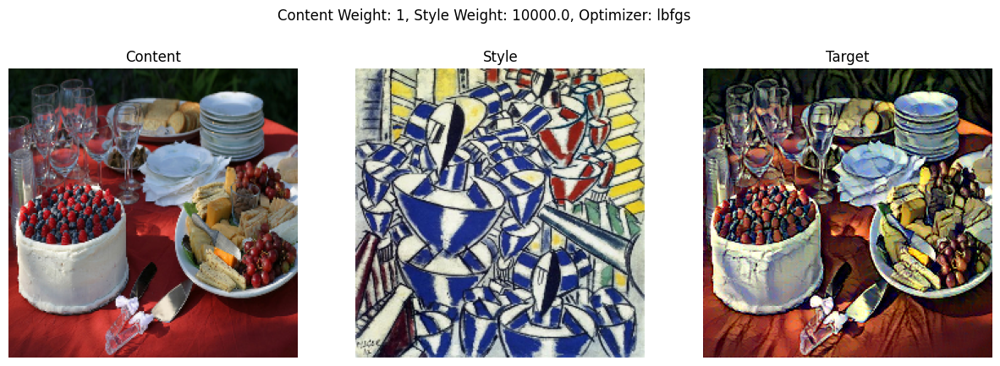

In [178]:
perform_style_transfer("dataset/content/picnic.jpg", "dataset/styles/the-exit-of-the-russian-ballet.jpg", 1, 1e4)


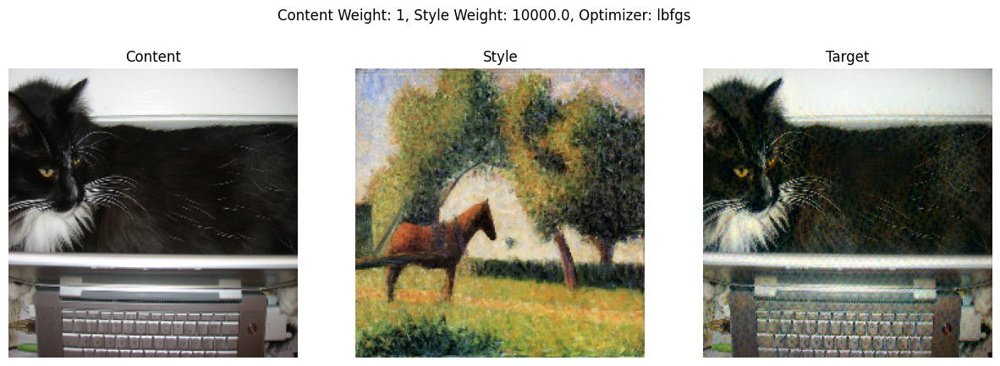

In [174]:
perform_style_transfer("dataset/content/cat.jpg", "dataset/styles/horse-cart.jpg", 1, 1e4)


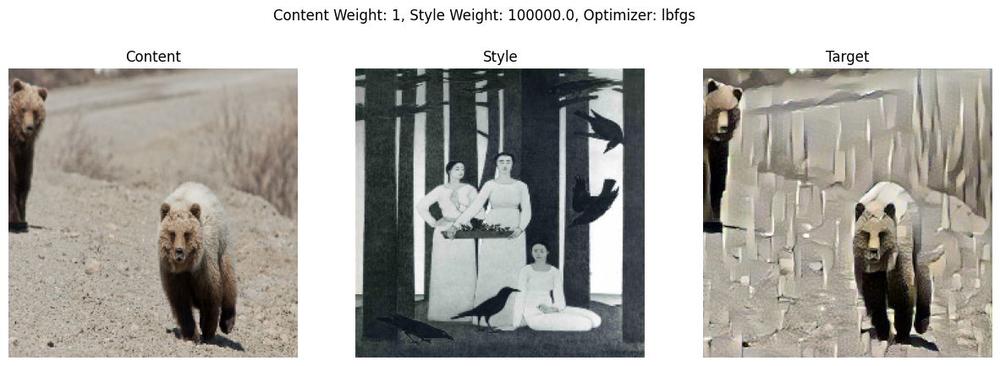

In [176]:
perform_style_transfer("dataset/content/bear.jpg", "dataset/styles/not-detected.jpg", 1, 1e5)

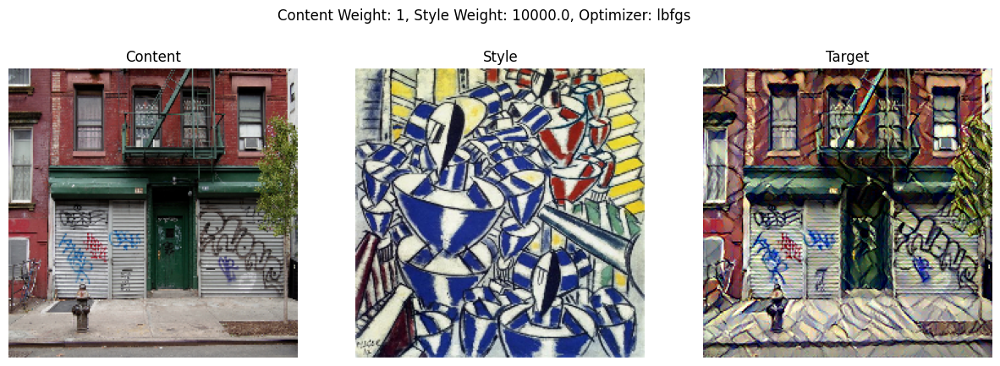

In [180]:
perform_style_transfer("dataset/content/building.jpg", "dataset/styles/the-exit-of-the-russian-ballet.jpg", 1, 1e4)


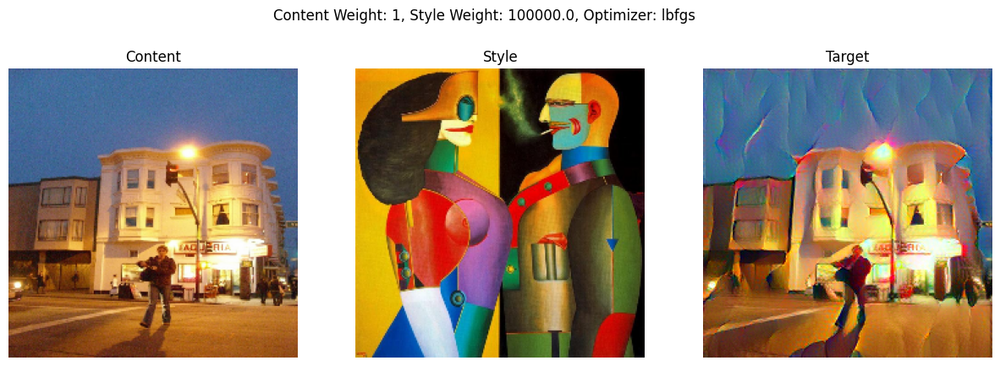

In [191]:
perform_style_transfer("dataset/content/white-building.jpg", "dataset/styles/the-couple.jpg", 1, 1e5)

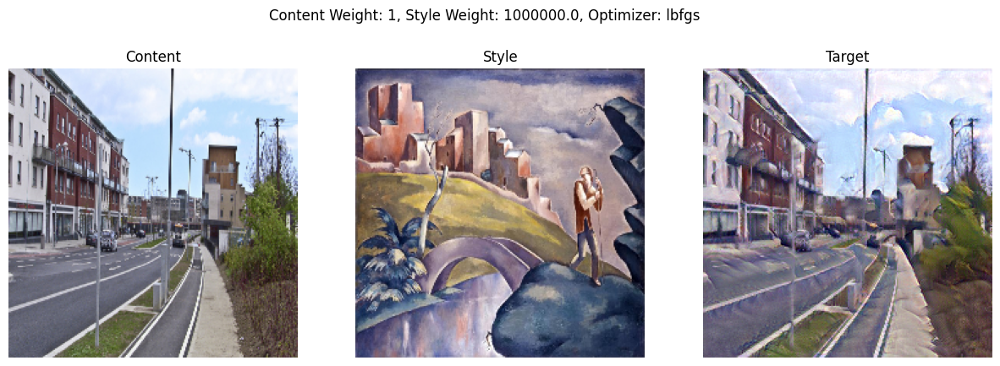

In [196]:
perform_style_transfer("dataset/content/town.jpg", "dataset/styles/landscape-with-a-palace.jpg", 1, 1e6)


The style transfer works well for a variety of styles and content images. Here are some examples of good outputs.
The style in general encodes a particular design or texture, and the content is the image that we want to apply the style to. In such cases, the output is a new image that has the content of the content image and the style of the style image.
Styles such as oil painting, abstract art and pattern work well with this technique.

### Importance of Content and Style Weights

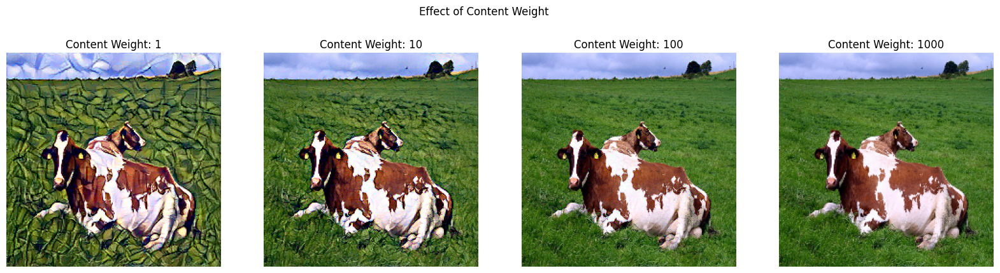

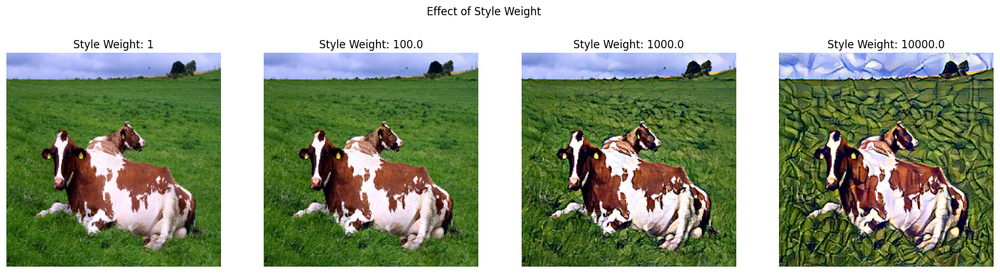

In [217]:
# effect of content weight
c_weights = [1, 10,100, 1000]
results_c = []
for c_weight in c_weights:
    t = perform_style_transfer("dataset/content/cows.jpg", "dataset/styles/the-exit-of-the-russian-ballet.jpg", c_weight, 1e4, show=False)
    results_c.append(t)
    
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    ax[i].imshow(results_c[i])
    ax[i].set_title(f"Content Weight: {c_weights[i]}")
    ax[i].axis('off')
plt.suptitle("Effect of Content Weight")
plt.show()

# effect of style weight
s_weights = [1, 1e2, 1e3, 1e4]
results_s = []
for s_weight in s_weights:
    t = perform_style_transfer("dataset/content/cows.jpg", "dataset/styles/the-exit-of-the-russian-ballet.jpg", 1, s_weight, show=False)
    results_s.append(t)
    
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    ax[i].imshow(results_s[i])
    ax[i].set_title(f"Style Weight: {s_weights[i]}")
    ax[i].axis('off')
plt.suptitle("Effect of Style Weight")
plt.show()

The content and style weights determine how much the content and style images influence the output image. The content weight determines how much the content image influences the output image, and the style weight determines how much the style image influences the output image. The content and style weights are hyperparameters that can be tuned to get the desired output image. 

As the content weight increases, the output image becomes more similar to the content image. Ideally, the content weight can be set on a lower side to get a well applied style on the content image.

As the style weight increases, the output image becomes more similar to the style image. Ideally, the style weight can be set on a higher side to get a well applied style on the content image.

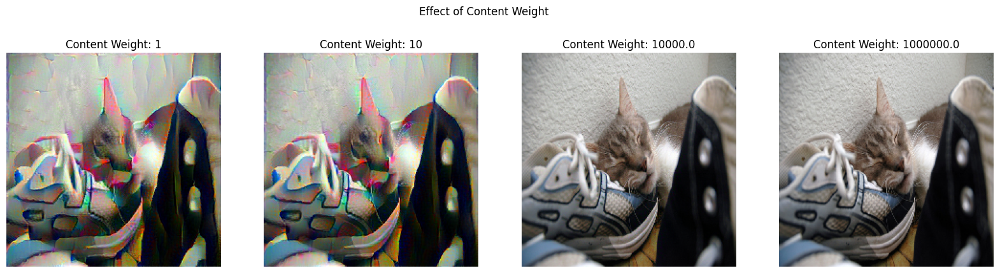

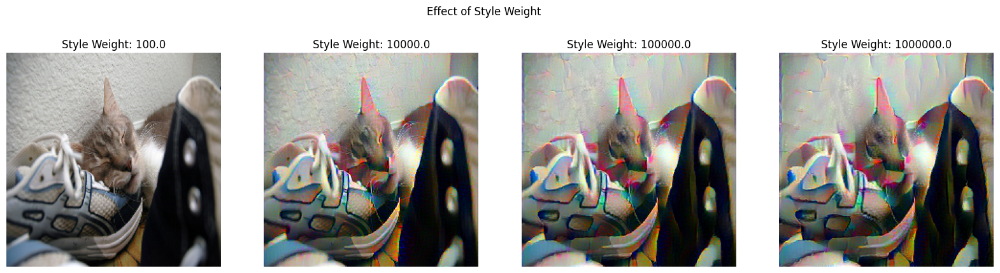

In [224]:
# effect of content weight
c_weights = [1, 10,1e4, 1e6]
results_c = []
for c_weight in c_weights:
    t = perform_style_transfer("dataset/content/cat-sleeping.jpg", "dataset/styles/the-couple.jpg", c_weight, 1e6, show=False)
    results_c.append(t)
    
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    ax[i].imshow(results_c[i])
    ax[i].set_title(f"Content Weight: {c_weights[i]}")
    ax[i].axis('off')
plt.suptitle("Effect of Content Weight")
plt.show()

# effect of style weight
s_weights = [1e2, 1e4, 1e5, 1e6]
results_s = []
for s_weight in s_weights:
    t = perform_style_transfer("dataset/content/cat-sleeping.jpg", "dataset/styles/the-couple.jpg", 1, s_weight, show=False)
    results_s.append(t)
    
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    ax[i].imshow(results_s[i])
    ax[i].set_title(f"Style Weight: {s_weights[i]}")
    ax[i].axis('off')
plt.suptitle("Effect of Style Weight")
plt.show()

A similar effect can be observed here. Greater the style weight and smaller the content weight, a more pronounced style is applied on the content image. For all the outputs shown, the ratio of style to content weights is from 10^4 to 10^6.

### Effect of Optimizer

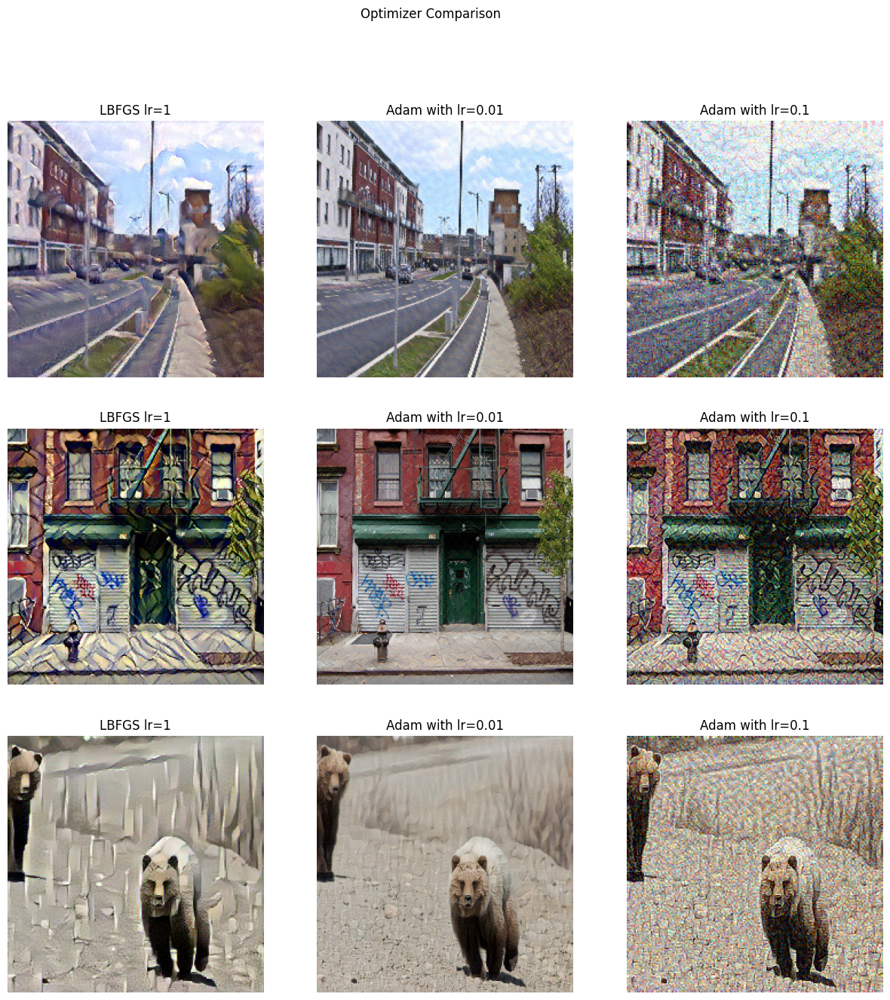

In [239]:
outputs_lbfgs = [
    perform_style_transfer("dataset/content/town.jpg", "dataset/styles/landscape-with-a-palace.jpg", 1, 1e6, show=False),
    perform_style_transfer("dataset/content/building.jpg", "dataset/styles/the-exit-of-the-russian-ballet.jpg", 1, 1e4, show=False),
    perform_style_transfer( "dataset/content/bear.jpg", "dataset/styles/not-detected.jpg", 1, 1e5, show=False),
]

outputs_adam_1 = [
    perform_style_transfer("dataset/content/town.jpg", "dataset/styles/landscape-with-a-palace.jpg", 1, 1e6, "adam", lr=0.01, show=False),
    perform_style_transfer("dataset/content/building.jpg", "dataset/styles/the-exit-of-the-russian-ballet.jpg", 1, 1e4,"adam", lr=0.01,  show=False),
    perform_style_transfer( "dataset/content/bear.jpg", "dataset/styles/not-detected.jpg", 1, 1e5, "adam", lr=0.01,  show=False),
]

outputs_adam_2 = [
    perform_style_transfer("dataset/content/town.jpg", "dataset/styles/landscape-with-a-palace.jpg", 1, 1e6, "adam", lr=0.1,show=False),
    perform_style_transfer("dataset/content/building.jpg", "dataset/styles/the-exit-of-the-russian-ballet.jpg", 1, 1e4,"adam", lr=0.1, show=False),
    perform_style_transfer( "dataset/content/bear.jpg", "dataset/styles/not-detected.jpg", 1, 1e5, "adam", lr=0.1, show=False),
]


fig, ax = plt.subplots(3, 3, figsize=(15, 15), )
for i in range(3):
    ax[i][0].imshow(outputs_lbfgs[i])
    ax[i][0].set_title("LBFGS lr=1")
    ax[i][0].axis('off')
    ax[i][1].imshow(outputs_adam_1[i])
    ax[i][1].set_title("Adam with lr=0.01")
    ax[i][1].axis('off')
    ax[i][2].imshow(outputs_adam_2[i])
    ax[i][2].set_title("Adam with lr=0.1")
    ax[i][2].axis('off')
    
plt.suptitle("Optimizer Comparison")
plt.show()


LBFGS optimizer is better than Adam optimizer for style transfer. LBFGS optimizer is a second order optimization algorithm, which uses the second derivative of the loss function to update the weights. This makes it faster and more accurate than Adam optimizer. It makes large updates to the weights leading to a faster convergence.

Adam optimizer is a first order optimization algorithm, which uses the first derivative of the loss function to update the weights. With a low learning rate of 0.01, almost no style is applied on the content image. With a high learning rate of 0.1, the output image becomes noisy. Style transfer with Adam optimizer is not as good as with LBFGS optimizer.

### Weird Outputs

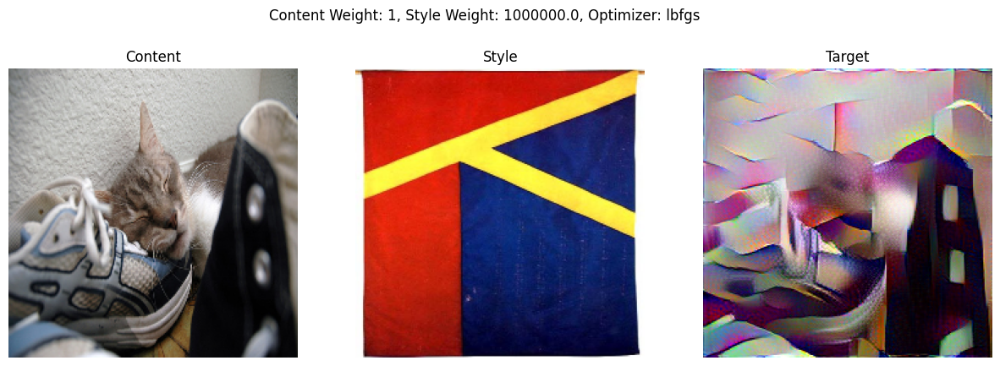

In [186]:
perform_style_transfer("dataset/content/cat-sleeping.jpg", "dataset/styles/bet-you.jpg", content_weight=1, style_weight=1e6)


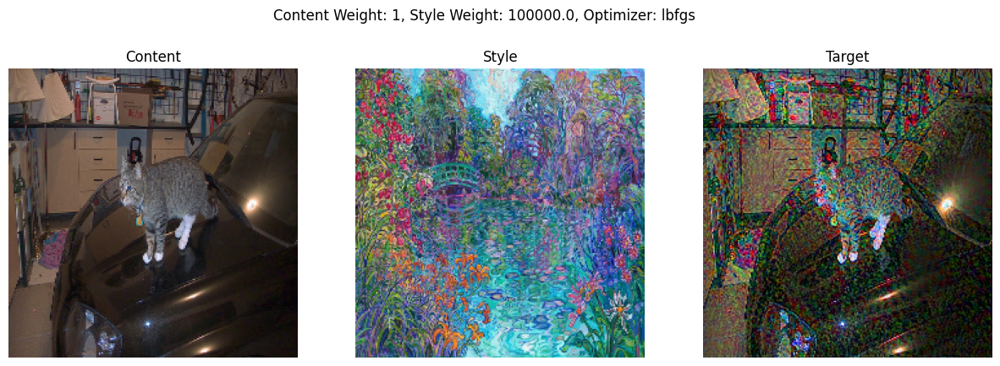

In [188]:
perform_style_transfer("dataset/content/cat-on-table.jpg", "dataset/styles/Erin-Hanson-Monet's-Bridge.jpg", content_weight=1, style_weight=1e5)


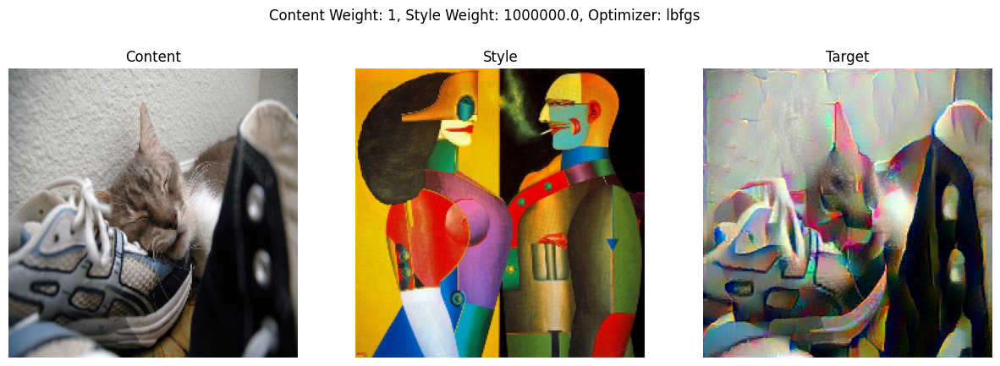

In [222]:
perform_style_transfer("dataset/content/cat-sleeping.jpg", "dataset/styles/the-couple.jpg", 1, 1e6)

The outputs are not as expected. The style is not correctly applied on the content image. These are cases where the style images themselves do not represent a particular style. The style images are abstract and do not have a particular style. This leads to weird outputs. However sometimes such style images can lead to interesting outputs which could arise from the abstract nature of the style images.

Another reason for weird outputs could be the content and style weights. The content and style weights are hyperparameters that can be tuned to get the desired output image. If the content and style weights are not set properly, the output image may not be as expected. A very high style weight and a very low content weight can lead to weird outputs.

Even the optimizer can lead to weird outputs. Adam optimizer is a first order optimization algorithm, which uses the first derivative of the loss function to update the weights. With a low learning rate of 0.01, almost no style is applied on the content image. With a high learning rate of 0.1, the output image becomes noisy. Style transfer with Adam optimizer is not as good as with LBFGS optimizer.

The content of the content image can also lead to weird outputs. The content image should be clear and have a particular content. If the content image is not clear, the output image may not be as expected.


### Random Outputs

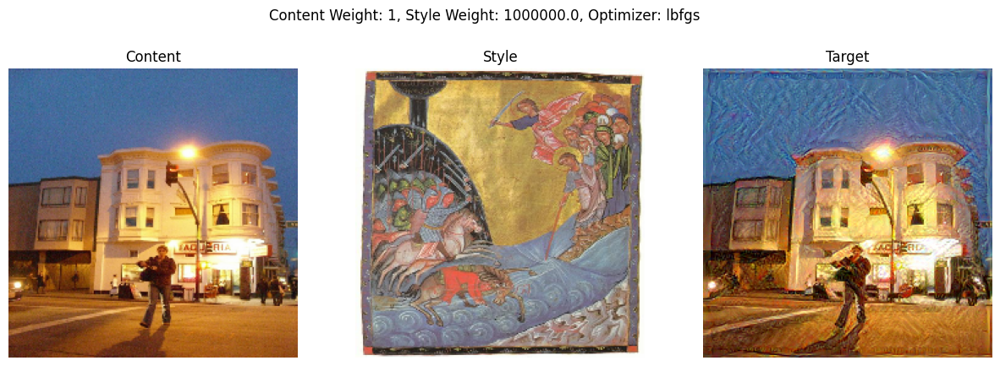

In [240]:
c = np.random.choice(content_img_paths)
s = np.random.choice(style_img_paths)
perform_style_transfer(c, s, content_weight=1, style_weight=1e6, _optimizer='lbfgs', show=True, verbose=False)